In [1]:
%matplotlib inline
%config InlineBackend.figure_format = "retina"

from matplotlib import rcParams
rcParams["savefig.dpi"] = 100
rcParams["figure.dpi"] = 100
rcParams["text.usetex"] = False

In [2]:
import time
import string

import emcee
import corner
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import pymc3 as pm

import theano
import theano.tensor as tt

from rvhmc import RVDataset, PolynomialTrend, RVModel, RVPlanet

In [110]:
def build_model(peaks, t, y=None, yerr=None, model=None):
    model = pm.modelcontext(model)
    
    if yerr is None:
        yerr = np.random.uniform(0.01, 0.1, len(t))
    if y is None:
        y = yerr*np.random.randn(len(t))
        
    trend = PolynomialTrend("trend", order=3)
    logs = pm.Normal("logs", mu=-5.0, sd=5.0, testval=-5.0)
#     logs = pm.Uniform("logs", -10.0, 2.0, testval=-5.0)
#     logs = None
    meanrv = pm.Normal("meanrv", mu=0.0, sd=10.0, testval=0.0)
    dataset = RVDataset("data", t, y, yerr, logs=logs, trend=trend)
    
    logamps = pm.Uniform("logamps",
                         lower=np.log(min_amp),
                         upper=np.log(max_amp),
                         shape=n_planets,
#                          transform=pm.distributions.transforms.ordered,
                         testval=np.log([np.clip(peak["amp"],
                                                 min_amp+1e-2,
                                                 max_amp-1e-2)
                                         for peak in peaks]))
    
    planets = []
    for i, (peak, name) in enumerate(zip(peaks, string.ascii_lowercase[1:])):
        logP = pm.Uniform(name + ":logP",
                          lower=np.log(min_period),
                          upper=np.log(max_period),
                          testval=np.log(peak["period"]))
        logK = pm.Deterministic(name + ":logK", logamps[i])
#         logK = pm.Uniform(name + ":logK",
#                           lower=np.log(min_amp),
#                           upper=np.log(max_amp),
#                           testval=np.log(np.clip(peak["amp"],
#                                                  min_amp+1e-2,
#                                                  max_amp-1e-2)))

#         eccen = None
        eccen = pm.Beta(name + ":eccen",
                        alpha=0.867,
                        beta=3.03,
                        testval=0.3)
        omegabase = pm.Uniform(name + ":omegabase", -2*np.pi, 2*np.pi, testval=0.0)
        omegavec = pm.Deterministic(name + ":omegavec", tt.stack([tt.cos(omegabase), tt.sin(omegabase)]))

#         planets.append(
#             RVPlanet(name, logP, logK, phi=peak["phase"], eccen=eccen))

        phibase = pm.Uniform(name + ":phibase", -2*np.pi, 2*np.pi, testval=peak["phase"])
        phivec = pm.Deterministic(name + ":phivec", tt.stack([tt.cos(phibase), tt.sin(phibase)]))
#         phibase = pm.Normal(name + ":phibase", shape=2, testval=np.array([np.cos(peak["phase"]), np.sin(peak["phase"])]))
#         phivec = pm.Deterministic(name + ":phivec", phibase / tt.sqrt(tt.sum(tt.square(phibase))))
        planets.append(
            RVPlanet(name, logP, logK, phivec=phivec, eccen=eccen, omegavec=omegavec))

#         if len(planets) > 1:
#             pm.Potential("order:{0}".format(name),
#                          tt.switch((planets[-2].logK < planets[-1].logK),
#                                    0.0, -np.inf))

    rvmodel = RVModel("rv", dataset, planets)
    pm.Deterministic("logp", model.logpt)
    
    return rvmodel

In [111]:
np.random.seed(42)
n_planets = 6

t = np.sort(np.random.uniform(0.0, 4*365.0, 50))
yerr = np.random.uniform(0.01, 0.1, len(t))
y = yerr * np.random.randn(len(t))

min_period = 5
max_period = 100
min_amp = 0.2
max_amp = 0.8
target_n_eff = 500

peaks = []
for i in range(n_planets):
    peaks.append(dict(
        period=np.exp(np.random.uniform(np.log(min_period), np.log(max_period))),
        amp=np.exp(np.random.uniform(np.log(min_amp), np.log(max_amp))),
        phase=np.random.uniform(0, 2*np.pi),
    ))
peaks = sorted(peaks, key=lambda x: x["amp"])

with pm.Model() as sim_model:
    sim_rvmodel = build_model(peaks, t, y, yerr)
    f = theano.function(sim_model.vars, sim_rvmodel.get_rvmodels(t), on_unused_input='ignore')
    coords = sim_model.test_point
    y += np.sum(f(*(coords[k.name] for k in sim_model.vars)), axis=1)

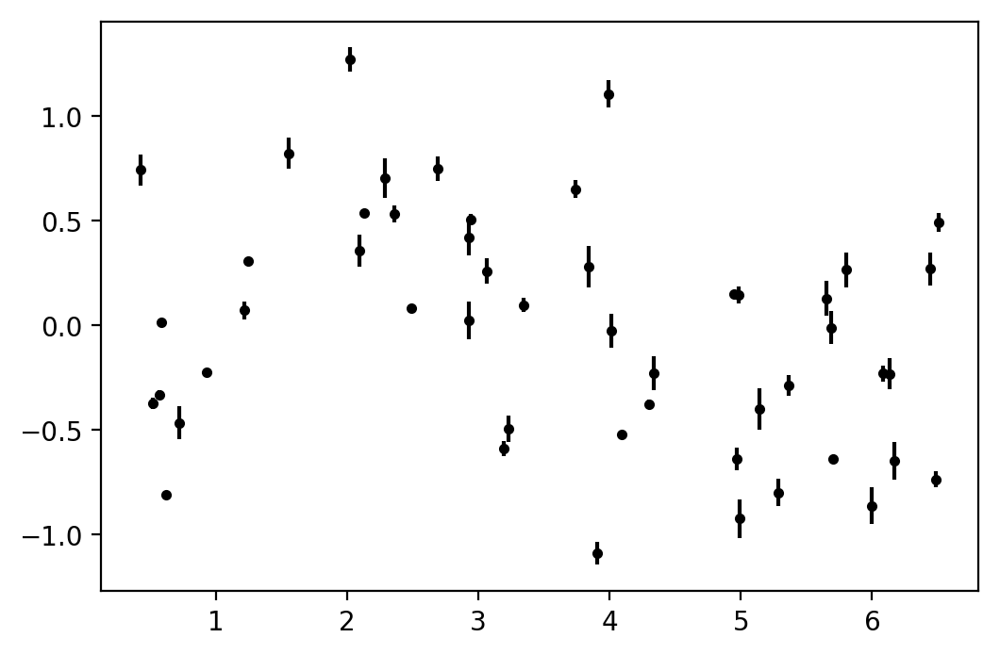

In [112]:
plt.errorbar(t % peaks[-1]["period"], y, yerr=yerr, fmt=".k");

In [113]:
with pm.Model() as model:
    rvmodel = build_model(peaks, t, y, yerr)
    
    key_vars = [v.name for v in rvmodel.datasets[0].vars]
    key_vars += [p.name + k for p in rvmodel.planets for k in (":logP", ":logK", ":phi", ":eccen", ":omega")]

In [114]:
with model:
    f = theano.function(model.vars, [model.logpt] + model.vars + model.deterministics)
    
    def log_prob_func(params):
        dct = model.bijection.rmap(params)
        args = (dct[k.name] for k in model.vars)
        results = f(*args)
        return tuple(results)

    # First we work out the shapes of all of the deterministic variables
    res = model.test_point
    vec = model.bijection.map(res)
    initial_blobs = log_prob_func(vec)[1:]
    dtype = [(var.name, float, np.shape(b)) for var, b in zip(model.vars + model.deterministics, initial_blobs)]
    
    # Then sample as usual
    coords = vec + 1e-5 * np.random.randn(3*len(vec), len(vec))
    nwalkers, ndim = coords.shape
    sampler = emcee.EnsembleSampler(nwalkers, ndim, log_prob_func, blobs_dtype=dtype)
    thin_by = 100
    
    tottime = 0
    for i in range(1000):
        strt = time.time()
        sampler.run_mcmc(coords, 50, thin_by=thin_by, progress=True)
        tottime += time.time() - strt
        tau = sampler.get_autocorr_time(quiet=True)
        print(sampler.iteration * nwalkers / tau)
        converged = np.all(tau * target_n_eff / thin_by < sampler.iteration * nwalkers)
        converged &= np.all(sampler.iteration > 50 * tau)
        if converged:
            break
    tau_emcee = np.copy(tau)
    time_emcee = tottime
    time_per_emcee = time_emcee / (sampler.iteration * nwalkers)
    time_ind_emcee = time_per_emcee * tau_emcee

100%|██████████| 5000/5000 [04:24<00:00, 18.27it/s]
N/50 = 1;
tau: [2.97544797 3.65113236 3.62079096 3.30178213 3.78408946 3.23526391
 3.15223714 3.31985684 3.11793841 3.36311472 3.24511115 3.30492094
 3.07901656 3.26186686 3.4252609  3.21538253 4.19156117 3.59861015
 3.79408469 3.9618076  3.45548389 3.41307593 5.3769569  4.12349854
 3.94544313 4.56550428 3.71438919 3.47379045 3.08701683 3.23316256
 3.70546627 4.55951043 3.50780295 3.43263132]
  0%|          | 2/5000 [00:00<04:38, 17.94it/s]

[1714.02761758 1396.82692688 1408.53201898 1544.62039078 1347.74826525
 1576.37835403 1617.89858005 1536.21082228 1635.69619844 1516.45139062
 1571.59485983 1543.15340552 1656.37303122 1563.52181586 1488.93767637
 1586.12542882 1216.73042324 1417.21380996 1344.1977227  1287.29118526
 1475.91485441 1494.25330747  948.49188702 1236.81382335 1292.63046924
 1117.07265816 1373.03867272 1468.13691624 1652.0803992  1577.40290243
 1376.3450057  1118.54114185 1453.90150759 1485.74068264]


100%|██████████| 5000/5000 [04:23<00:00, 18.50it/s]
N/50 = 2;
tau: [4.72399104 5.20317863 5.74245106 5.14157736 6.26187341 6.06232796
 5.60539987 5.32160504 5.47224013 5.7849806  5.16981682 5.7863768
 4.97073082 5.14285554 5.56239639 5.54476193 6.22981775 6.71701338
 5.75931346 5.87256761 5.52260795 5.33733427 9.33461843 6.75899635
 6.27957905 5.91525071 5.25255323 5.59176949 5.46621455 5.45976143
 5.07766692 7.99320882 6.05911768 6.09308114]
  0%|          | 2/5000 [00:00<04:41, 17.74it/s]

[2159.19122454 1960.34015333 1776.24500287 1983.82700146 1628.90549407
 1682.52197256 1819.67392922 1916.71496161 1863.95328978 1763.18655142
 1972.99060049 1762.76111224 2052.01214218 1983.33395294 1833.74201976
 1839.57402083 1637.2870608  1518.53203573 1771.0444266  1736.88932747
 1846.95348504 1911.06636563 1092.70668901 1509.09979518 1624.31270029
 1724.3563301  1941.9127337  1824.10952567 1866.00798465 1868.21349814
 2008.7965919  1276.08326462 1683.41341719 1674.02989927]


100%|██████████| 5000/5000 [04:21<00:00, 19.66it/s]
N/50 = 3;
tau: [ 5.73882119  6.30660599  7.37956117  6.29642426  7.22760159  6.92953763
  6.87596164  6.31724514  7.02071573  7.5825851   6.55909018  7.26761482
  6.54068088  6.05680677  7.11964602  6.93931935  7.75105559  8.11157284
  6.92868883  7.28573825  6.93552936  7.12851018 11.06538176  8.75547905
  7.28503567  7.28867938  6.63375027  7.35313064  7.11977089  6.50859101
  6.05801759  9.51255041  7.63683687  7.71222428]
  0%|          | 2/5000 [00:00<04:47, 17.38it/s]

[2666.05274593 2426.02756799 2073.29401286 2429.95061559 2116.88480671
 2207.93952184 2225.14330221 2421.94179116 2179.26499152 2017.78150723
 2332.64059028 2105.22989574 2339.20600528 2526.0835597  2148.98324435
 2204.82719092 1973.92468863 1886.19399774 2208.21000454 2099.99309345
 2206.03204168 2146.31102632 1382.69065936 1747.47719731 2100.19561953
 2099.14570215 2306.38769675 2080.74638419 2148.94555344 2350.73919487
 2525.57866908 1608.40146355 2003.44727201 1983.86346648]


100%|██████████| 5000/5000 [04:17<00:00, 19.41it/s]
N/50 = 4;
tau: [ 6.21824406  7.54748557  8.16022797  6.83889887  7.91070963  7.76715692
  7.8009321   6.9415694   7.97409738  8.54093014  7.97113696  8.29388156
  6.93877927  6.85248244  8.29072532  7.29913007  8.13661168  8.38541636
  7.80489867  7.87874188  7.49916947  7.91804103 11.67142573  9.51163706
  8.41477421  8.12271494  7.5826046   8.37327581  7.73029901  7.334188
  6.47751229 10.35029081  8.32225972  8.12479625]
  0%|          | 3/5000 [00:00<04:05, 20.34it/s]

[3280.66891721 2702.88691557 2499.93015779 2982.93634724 2578.78255669
 2626.44365244 2615.07211303 2938.81668788 2558.28327938 2388.49863751
 2559.23340779 2459.64448072 2939.99840666 2977.02331693 2460.58085466
 2794.85360724 2507.1861355  2432.79511886 2613.74309489 2589.24588713
 2720.30123725 2576.3948338  1747.85844333 2144.74121214 2424.30747173
 2511.47555362 2690.36842614 2436.32247098 2638.96648352 2781.49401182
 3149.35720652 1970.95911343 2451.25731298 2510.83219598]


100%|██████████| 5000/5000 [04:09<00:00, 20.02it/s]
N/50 = 5;
tau: [ 6.80934394  8.24589375  8.98522797  7.36586858  8.2543539   8.1115995
  7.93776473  7.2569553   8.76796793  9.74951567  8.62699365  9.36171898
  7.64445611  7.19356215  8.92753166  7.67270562  8.20378042  9.18424486
  8.55411861  8.10384493  8.36534105  8.33795714 12.03246365 10.44489824
  9.3643477   9.09664479  7.98059796  9.71020478  7.93813751  7.53116081
  6.98716982 10.311535    8.87302803  8.54431773]
  0%|          | 0/5000 [00:00<?, ?it/s]

[3744.85416355 3092.44828855 2837.99143334 3461.91351595 3089.27873696
 3143.64632838 3212.49128142 3513.87034385 2908.31355725 2615.51454126
 2955.83850281 2723.85873405 3335.75072189 3544.83626874 2856.33263161
 3323.46909359 3108.3230763  2776.49391702 2981.02015507 3146.65448755
 3048.29173858 3058.30308    2119.2667385  2441.38328768 2723.09410268
 2803.23136624 3195.24929493 2626.10321587 3212.34042156 3385.93221271
 3649.54633319 2472.95868217 2873.87799562 2984.43957629]


100%|██████████| 5000/5000 [04:09<00:00, 20.02it/s]
N/50 = 6;
tau: [ 7.14071293  8.70662979  9.41540389  8.03906908  9.30775882  8.58700489
  8.54359159  7.99490316  9.37719925 10.49022316  9.56697008 10.19041663
  8.52218942  8.37130597  9.68978791  8.40365724  8.28336613  9.71587827
  9.38196967  8.53114522  8.7240793   9.4774862  12.82870785 11.31756266
 10.18128201  9.65805137  8.62648688 10.30752591  8.03012917  8.03390181
  7.15242695 10.57773574  9.79406934  9.04625066]
  0%|          | 0/5000 [00:00<?, ?it/s]

[4285.28639631 3514.56312563 3249.99334573 3806.41087692 3287.57981378
 3563.52423048 3581.63187788 3827.43848258 3263.23448851 2917.00181544
 3198.50483031 3002.8212889  3590.62659566 3655.34363595 3157.96385607
 3641.271785   3694.15036161 3149.4836741  3261.57524228 3586.85723826
 3507.53345562 3228.7042538  2385.27530294 2703.76236577 3005.51541304
 3168.34098529 3547.21457613 2968.70464159 3810.64854139 3808.85909858
 4278.26809426 2892.86863915 3124.3397345  3382.61686147]


100%|██████████| 5000/5000 [04:17<00:00, 19.40it/s]
N/50 = 7;
tau: [ 7.39517869  9.34576601  9.72280932  8.50782377  9.78085664  9.02100364
  9.43721274  8.25941824 10.15801071 10.84858859 10.04004679 10.93145375
  9.20323056  9.4795258  10.42354201  8.79476624  8.70765438  9.96418802
  9.97400283  8.77009864  9.13226029 10.50435597 13.16809934 11.73342571
 10.86604162 10.59116579  9.21384643 10.58434848  8.43189039  8.54733456
  7.39443419 10.9000326  10.57018538  9.68331869]
  0%|          | 2/5000 [00:00<04:40, 17.80it/s]

[4827.46956082 3819.91159905 3671.77827116 4196.13769015 3649.98704411
 3957.4310605  3782.89659951 4322.33832613 3514.46764643 3290.7506534
 3555.76032136 3265.80533811 3879.07265589 3766.01116602 3424.93942569
 4059.23239269 4099.84117726 3582.83082837 3579.30518219 4070.64976915
 3909.21840455 3398.59008001 2711.09740847 3042.58968162 3285.4650524
 3370.73375077 3874.60332235 3372.90481941 4233.92600379 4176.74068656
 4827.95560641 3275.21956363 3377.42421058 3686.75256151]


100%|██████████| 5000/5000 [04:30<00:00, 18.50it/s]
N/50 = 8;
tau: [ 7.89256124  9.59134975 10.12278907  9.08722489 10.17520441  9.37465207
 10.07153678  8.66192289 10.58027047 11.30235805 10.38818649 11.35691579
  9.69187164 10.01234199 10.71832908  9.18883273  9.0998116  10.34264184
 10.37024629  9.11794448  9.70359608 11.09910445 13.07047686 12.19231024
 11.68860646 11.39033541  9.70425179 10.96594143  8.74814152  8.61553782
  7.67669788 11.11067213 10.99730713 10.13645725]
  0%|          | 2/5000 [00:00<04:38, 17.97it/s]

[5169.42456749 4253.8329916  4030.5097463  4489.81955554 4009.74745679
 4352.16152125 4051.02030352 4710.2705155  3856.2341222  3609.86617407
 3927.5382702  3592.52465729 4209.71320079 4074.97067534 3806.56347761
 4440.17223996 4483.6093087  3944.83349965 3934.33278746 4474.69274531
 4204.6267852  3675.97225255 3121.53875083 3346.37154041 3490.57863752
 3581.98406958 4204.34268345 3720.61078894 4663.84773211 4735.63007104
 5314.78516668 3672.14507888 3709.99914212 4025.07493573]


100%|██████████| 5000/5000 [04:34<00:00, 18.81it/s]
N/50 = 9;
tau: [ 7.93463557  9.63779715 10.24765492  9.27475164 10.37626532  9.63736426
 10.38373335  8.99567132 10.90669867 11.56408175 10.79322391 11.6557643
  9.8472859  10.16497809 10.8290477   9.42254834  9.27337808 10.56147502
 10.92930701  9.28851055 10.35529459 11.23336884 13.1490853  12.72938828
 11.77674638 12.03993043  9.68925069 11.38979841  9.15004181  8.83217744
  7.80346193 11.44783938 11.50362785 10.65973721]
  0%|          | 0/5000 [00:00<?, ?it/s]

[5784.76473356 4762.49907297 4479.07353856 4948.91958331 4423.55689388
 4762.7129959  4420.37545324 5102.45410111 4208.42286063 3969.18674563
 4252.66818923 3937.96569859 4661.18283412 4515.50407731 4238.59985342
 4871.29366002 4949.65260978 4345.98386048 4199.71732337 4941.58883103
 4432.51513507 4086.04049551 3490.73710817 3605.82920236 3897.51112258
 3812.31438751 4737.20842379 4029.92207291 5016.37052128 5196.90646059
 5882.00473529 4009.49021677 3990.04562816 4305.92228515]


100%|██████████| 5000/5000 [04:27<00:00, 19.13it/s]
N/50 = 10;
tau: [ 7.94003296  9.61227263 10.5844558   9.42855276 10.61050338  9.69585302
 10.24384858  9.15836104 11.35267927 11.73422526 10.78422358 12.11949097
 10.0110766  10.18852976 11.17478563  9.85381513  9.6276051  10.57306187
 11.12969461  9.45385327 10.7651699  11.58772361 13.15823573 13.37764269
 12.24640767 12.64637957 10.34678049 11.84866623  9.27762676  8.88155026
  7.95004966 11.44529642 12.27381311 11.37804968]
  0%|          | 0/5000 [00:00<?, ?it/s]

[6423.1471428  5305.71717478 4818.38659901 5409.10161842 4806.55800735
 5259.98072666 4978.5976022  5568.68197041 4492.33161508 4346.26052272
 4729.1304376  4208.09752767 5094.35718384 5005.62899451 4563.84593733
 5175.66032404 5297.26754264 4823.57907758 4582.33597577 5394.62571806
 4737.50070658 4401.20956528 3875.89955486 3812.33085628 4164.48654721
 4032.77473216 4929.06948732 4304.28193476 5497.09546534 5742.24076949
 6415.0542646  4455.97895525 4155.18792417 4482.31475831]


100%|██████████| 5000/5000 [04:21<00:00, 19.03it/s]
N/50 = 11;
tau: [ 8.14863922  9.78500704 10.55883947  9.75615216 11.02983161  9.90971802
 10.49567839  9.73614979 11.69335225 11.87376806 11.31409333 12.1233956
 10.26116493 10.53555849 11.47686533 10.32828852  9.98362545 10.86214926
 11.70237069  9.64916793 11.36371925 12.11977667 13.39806257 14.61914611
 12.55403805 13.63114011 10.5852992  12.12366011  9.50131651  9.24000879
  8.10251197 11.45422713 12.79239499 11.88791006]
  0%|          | 0/5000 [00:00<?, ?it/s]

[6884.58508272 5733.26107489 5313.0838988  5750.21782154 5086.20638685
 5661.10961919 5345.0570726  5762.03131812 4797.59771217 4724.70067685
 4958.41764377 4627.41643239 5467.21550591 5324.82450516 4888.09429886
 5431.68404592 5619.20118646 5164.72372726 4793.90043814 5813.97281428
 4936.7639898  4628.79816467 4187.17256373 3837.43342999 4468.68169081
 4115.57650749 5299.80295769 4627.31547257 5904.44491943 6071.42279479
 6923.77872574 4897.75515694 4385.418058   4719.08011711]


100%|██████████| 5000/5000 [04:21<00:00, 19.18it/s]
N/50 = 12;
tau: [ 8.39683922  9.99084034 10.69520142  9.96445962 11.21384208  9.97941015
 10.63130563  9.96975505 11.81921006 12.15809826 11.63421593 12.19602534
 10.40959305 10.63691525 11.53313082 10.48663999 10.24398913 11.10177347
 11.71197584  9.76982865 11.79214208 12.28128954 13.73204143 15.15339687
 13.20547342 14.12091974 10.82452784 12.21706366  9.62891585  9.37371959
  8.07875823 11.64235289 12.92756045 11.96969585]
  0%|          | 0/5000 [00:00<?, ?it/s]

[7288.45681363 6125.61084987 5722.19237398 6141.82829332 5457.54074063
 6132.6269896  5756.58363474 6138.56606281 5178.01102436 5033.68196948
 5260.34589365 5018.02827435 5879.19236721 5753.54776816 5306.45155586
 5835.99704339 5974.23515748 5512.63274706 5225.42061371 6264.1835605
 5189.89676099 4983.19006448 4456.72992637 4038.69842105 4634.44195005
 4333.99531426 5653.82628367 5009.38701044 6355.85573023 6528.89169903
 7575.42164949 5256.66938333 4734.07185031 5112.91186874]


100%|██████████| 5000/5000 [04:17<00:00, 19.40it/s]
N/50 = 13;
tau: [ 8.55548091 10.05389438 10.81724825 10.18899429 11.10983689  9.98592805
 10.56508962 10.06397443 11.97971509 12.41909478 11.85611516 12.3035011
 10.6773149  10.73222135 11.64132718 10.97552668 10.25448676 11.13538416
 11.42084911  9.86941749 11.78666903 12.45664526 14.1042537  15.17446871
 13.68874449 14.60391882 11.05479151 12.44843533  9.77487145  9.52115674
  8.15381611 11.87478298 13.1639393  12.28350498]
  0%|          | 0/5000 [00:00<?, ?it/s]

[7749.41825956 6594.45956868 6129.10034798 6507.02102053 5967.68437582
 6639.34285123 6275.38453255 6587.85457345 5534.35532275 5338.55334455
 5592.05094451 5388.71004739 6209.42630614 6177.65864649 5695.22692741
 6040.71238705 6465.46253562 5953.99306185 5805.17257065 6717.72169657
 5624.99887223 5322.46030864 4700.70954498 4369.18097654 4843.3952455
 4539.87733228 5997.39940467 5325.97055352 6782.69789558 6963.43961536
 8131.16203838 5583.25993112 5036.48630465 5397.48224123]


100%|██████████| 5000/5000 [04:09<00:00, 20.06it/s]
N/50 = 14;
tau: [ 8.70541585 10.19596604 11.09766334 10.51861168 11.05720838 10.14288242
 10.78703084 10.16597745 11.94629686 12.59169872 11.93392865 12.38833209
 10.64049681 10.99322296 11.89055125 11.01249837 10.62577483 11.68731197
 12.04485495 10.30050744 12.09517086 12.64971889 14.3792006  15.59177762
 14.17268069 14.52336103 11.15496893 12.43138426 10.1535353   9.81563714
  8.29410008 12.02649421 13.39201959 12.44104398]
  0%|          | 0/5000 [00:00<?, ?it/s]

[8201.79084494 7002.76949977 6433.78680621 6787.96804783 6457.32607889
 7039.41907375 6619.05959698 7023.426948   5976.7475101  5670.40250852
 5982.9417537  5763.48772909 6710.21299551 6494.91056803 6004.76786233
 6483.54239105 6719.5099789  6109.18919282 5927.8422429  6931.69734003
 5903.18242283 5644.39420498 4965.50552452 4579.33673246 5037.86133038
 4916.21738587 6400.73499733 5743.52771083 7032.03346211 7274.10752614
 8608.52887133 5936.89222547 5331.53341782 5739.06821071]


100%|██████████| 5000/5000 [04:09<00:00, 20.24it/s]
N/50 = 15;
tau: [ 8.97425379 10.36420549 11.3388233  10.71415072 11.3464214  10.3310976
 10.82119328 10.36904974 12.10607222 12.85301527 12.33806971 12.6340212
 10.88027032 11.21763824 11.92912325 11.22749271 10.71404247 12.02392391
 12.58594447 10.37690431 12.43855405 13.01539164 14.57614237 16.16636213
 14.45301889 14.85335606 11.46136273 12.80834081 10.1911762  10.18708839
  8.41277966 12.13140934 13.63474419 12.5094034 ]
  0%|          | 0/5000 [00:00<?, ?it/s]

[8524.38562509 7381.17360608 6746.73182595 7140.08996299 6742.2138922
 7404.82792557 7069.46063977 7377.72524409 6319.14287496 5951.91076686
 6200.32159029 6055.07927854 7031.07530562 6819.61731815 6412.87698844
 6813.63167844 7140.1621035  6362.31571297 6078.20892339 7372.14083473
 6150.23255198 5877.6564031  5248.3021959  4732.04790226 5293.01183165
 5150.3511865  6674.59898403 5972.67055417 7506.49370238 7509.50586407
 9093.30840657 6305.9449922  5610.66631836 6115.39955755]


100%|██████████| 5000/5000 [04:10<00:00, 19.62it/s]
N/50 = 16;
tau: [ 8.97558955 10.29686737 11.39834172 10.63900263 11.57975407 10.51991599
 10.89362456 10.55339954 12.12929722 12.92098815 12.39438368 12.7176229
 10.849827   11.13823382 11.78835215 11.32246608 10.7609274  12.17830424
 12.48761366 10.36830267 12.37507427 12.91844712 14.60455333 16.1597774
 14.54784718 14.961373   11.385175   12.75922382 10.34585808 10.23508958
  8.59840481 11.99343416 13.52545877 12.35791777]
  0%|          | 0/5000 [00:00<?, ?it/s]

[9091.32481437 7924.7403182  7158.93609736 7669.89189217 7046.7817827
 7756.71593916 7490.61981475 7732.10562709 6727.51260808 6315.3064666
 6583.62707969 6416.29341218 7520.8572467  7326.11662935 6922.08706847
 7206.91052932 7582.98954634 6700.44025641 6534.47505938 7870.14061859
 6593.89981985 6316.54867381 5587.29857534 5049.57450603 5609.077344
 5454.04489302 7167.21526016 6395.37334883 7887.21431882 7972.57311163
 9490.13239241 6803.7226808  6033.06707646 6603.05413148]


100%|██████████| 5000/5000 [04:08<00:00, 20.14it/s]


[9622.61440906 8337.41458937 7524.61048931 8025.73323471 7548.03502187
 8177.03884536 8014.49471964 8293.00971972 6939.94877376 6777.76585388
 6882.41846491 6669.55611697 7953.17518819 7743.72578556 7263.307026
 7605.53959259 8065.06109848 7032.36651572 6860.3361158  8270.64256575
 7030.14196855 6703.95248169 5936.40068253 5432.10538712 5916.95078596
 5657.90647986 7492.2197347  6678.61249721 8327.66839133 8357.15878775
 9942.53483302 7094.40507632 6381.96169828 7009.72683221]


In [115]:
time_ind_emcee

array([0.45684405, 0.52726586, 0.58422082, 0.54774236, 0.58240775,
       0.5376071 , 0.54851045, 0.53008911, 0.63343898, 0.64859634,
       0.63873392, 0.65911944, 0.5527395 , 0.56768979, 0.60523864,
       0.57800424, 0.54507139, 0.62511447, 0.6407899 , 0.53152268,
       0.62531228, 0.65573766, 0.7405218 , 0.80926893, 0.742956  ,
       0.77697186, 0.58674655, 0.65822566, 0.52788294, 0.52602017,
       0.4421442 , 0.61964803, 0.68882176, 0.62713344])

In [116]:
with model:
    start = model.test_point
    
    ntune = 2000
    samples = sampler.get_chain(discard=int(tau_emcee.max()), flat=True)
    potential = pm.step_methods.hmc.quadpotential.QuadPotentialFull(
        np.cov(samples, rowvar=0))
#     potential = pm.step_methods.hmc.quadpotential.QuadPotentialDiagAdapt(
#         ndim, np.mean(samples, axis=0), np.var(samples, axis=0), 50)
    step = pm.NUTS(potential=potential)
#     ntune = 5000
#     _, step = pm.init_nuts(init="adapt_diag", target_accept=0.8)
    
    print("Running burn-in...")
    burnin = pm.sample(start=start, tune=ntune, draws=1, step=step, chains=1,
                       compute_convergence_checks=False)
    
    trace = None
    next_start = burnin.point(-1)
    draws = 2000
    chains = 2
    ntotal = 0
    tottime = 0
    for i in range(100):
        strt = time.time()
        trace = pm.sample(start=next_start, trace=trace, tune=0, draws=draws, step=step, chains=chains,
                          compute_convergence_checks=False, cores=1)
        tottime += time.time() - strt
        ntotal += draws * chains
        next_start = [trace.point(-1, c) for c in trace.chains]

        tau = np.array([float(emcee.autocorr.integrated_time(np.array(trace.get_values(v, combine=False)).T,
                                                             quiet=True))
                        for v in key_vars])
        print(tau)
        print(ntotal / tau)
        print(pm.summary(trace, varnames=key_vars).n_eff)
        
        if (ntotal / tau).min() > target_n_eff and ntotal > tau.max() * 50:
            break
    tau_pymc = np.copy(tau)
    time_pymc = tottime
    time_per_pymc = time_pymc / (len(trace) * chains)
    time_ind_pymc = time_per_pymc * tau_pymc

Only 1 samples in chain.
Sequential sampling (1 chains in 1 job)
INFO:pymc3:Sequential sampling (1 chains in 1 job)
NUTS: [g:phibase, g:omegabase, g:eccen, g:logP, f:phibase, f:omegabase, f:eccen, f:logP, e:phibase, e:omegabase, e:eccen, e:logP, d:phibase, d:omegabase, d:eccen, d:logP, c:phibase, c:omegabase, c:eccen, c:logP, b:phibase, b:omegabase, b:eccen, b:logP, logamps, meanrv, logs, trend:d2vdt2, trend:d1vdt1]
INFO:pymc3:NUTS: [g:phibase, g:omegabase, g:eccen, g:logP, f:phibase, f:omegabase, f:eccen, f:logP, e:phibase, e:omegabase, e:eccen, e:logP, d:phibase, d:omegabase, d:eccen, d:logP, c:phibase, c:omegabase, c:eccen, c:logP, b:phibase, b:omegabase, b:eccen, b:logP, logamps, meanrv, logs, trend:d2vdt2, trend:d1vdt1]
  0%|          | 0/2001 [00:00<?, ?it/s]

Running burn-in...


100%|██████████| 2001/2001 [00:30<00:00, 66.68it/s]
Sequential sampling (2 chains in 1 job)
INFO:pymc3:Sequential sampling (2 chains in 1 job)
NUTS: [g:phibase, g:omegabase, g:eccen, g:logP, f:phibase, f:omegabase, f:eccen, f:logP, e:phibase, e:omegabase, e:eccen, e:logP, d:phibase, d:omegabase, d:eccen, d:logP, c:phibase, c:omegabase, c:eccen, c:logP, b:phibase, b:omegabase, b:eccen, b:logP, logamps, meanrv, logs, trend:d2vdt2, trend:d1vdt1]
INFO:pymc3:NUTS: [g:phibase, g:omegabase, g:eccen, g:logP, f:phibase, f:omegabase, f:eccen, f:logP, e:phibase, e:omegabase, e:eccen, e:logP, d:phibase, d:omegabase, d:eccen, d:logP, c:phibase, c:omegabase, c:eccen, c:logP, b:phibase, b:omegabase, b:eccen, b:logP, logamps, meanrv, logs, trend:d2vdt2, trend:d1vdt1]
100%|██████████| 2000/2000 [00:27<00:00, 72.21it/s]


[2.75772521 1.91476763 2.30036111 4.09215697 2.11849547 3.04231597
 2.58480897 2.48391101 1.98588997 2.68698783 1.15515928 4.88146156
 4.72500547 2.1331587  2.5447028  1.85877306 2.37676594 3.23779747
 2.70791255 2.19923519 2.59935197 2.1990979  2.46943513 2.16322674
 1.53439289 1.94517476 2.5453509  1.87569944 1.95673634 1.80773426
 1.59308217 2.07045644 2.02046559]
[1450.47083764 2089.02633175 1738.85742961  977.47961101 1888.13242641
 1314.78782471 1547.50314325 1610.36365138 2014.2102803  1488.65579111
 3462.72594135  819.42671288  846.55986662 1875.15350278 1571.89279507
 2151.95716092 1682.95915532 1235.40772234 1477.15257765 1818.81411348
 1538.84508109 1818.92766526 1619.80363538 1849.08956891 2606.89424179
 2056.37049886 1571.49256098 2132.5378201  2044.22022702 2212.71460993
 2510.85604441 1931.9411489  1979.74170769]
logs            1505.776096
trend:d1vdt1    2047.751331
trend:d2vdt2    1697.843771
b:logP           935.598797
b:logK          1796.658367
b:phi           1306

In [117]:
time_ind_pymc, time_ind_emcee

(array([0.03903419, 0.02710256, 0.03256044, 0.05792239, 0.02998622,
        0.04306243, 0.03658665, 0.03515849, 0.02810926, 0.03803294,
        0.01635069, 0.0690946 , 0.06688004, 0.03019377, 0.03601897,
        0.02630998, 0.03364191, 0.04582937, 0.03832912, 0.03112905,
        0.0367925 , 0.03112711, 0.03495359, 0.03061937, 0.02171855,
        0.02753296, 0.03602814, 0.02654957, 0.0276966 , 0.02558756,
        0.02254927, 0.02930626, 0.02859866]),
 array([0.45684405, 0.52726586, 0.58422082, 0.54774236, 0.58240775,
        0.5376071 , 0.54851045, 0.53008911, 0.63343898, 0.64859634,
        0.63873392, 0.65911944, 0.5527395 , 0.56768979, 0.60523864,
        0.57800424, 0.54507139, 0.62511447, 0.6407899 , 0.53152268,
        0.62531228, 0.65573766, 0.7405218 , 0.80926893, 0.742956  ,
        0.77697186, 0.58674655, 0.65822566, 0.52788294, 0.52602017,
        0.4421442 , 0.61964803, 0.68882176, 0.62713344]))

In [118]:
time_ind_pymc, time_ind_emcee

(array([0.03903419, 0.02710256, 0.03256044, 0.05792239, 0.02998622,
        0.04306243, 0.03658665, 0.03515849, 0.02810926, 0.03803294,
        0.01635069, 0.0690946 , 0.06688004, 0.03019377, 0.03601897,
        0.02630998, 0.03364191, 0.04582937, 0.03832912, 0.03112905,
        0.0367925 , 0.03112711, 0.03495359, 0.03061937, 0.02171855,
        0.02753296, 0.03602814, 0.02654957, 0.0276966 , 0.02558756,
        0.02254927, 0.02930626, 0.02859866]),
 array([0.45684405, 0.52726586, 0.58422082, 0.54774236, 0.58240775,
        0.5376071 , 0.54851045, 0.53008911, 0.63343898, 0.64859634,
        0.63873392, 0.65911944, 0.5527395 , 0.56768979, 0.60523864,
        0.57800424, 0.54507139, 0.62511447, 0.6407899 , 0.53152268,
        0.62531228, 0.65573766, 0.7405218 , 0.80926893, 0.742956  ,
        0.77697186, 0.58674655, 0.65822566, 0.52788294, 0.52602017,
        0.4421442 , 0.61964803, 0.68882176, 0.62713344]))

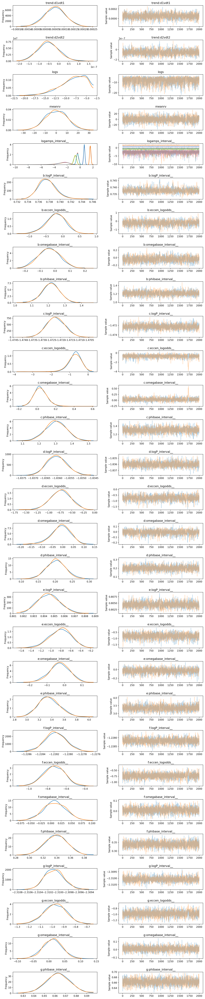

In [119]:
pm.traceplot(trace, varnames=[v.name for v in model.vars]);

In [120]:
pm.summary(trace, varnames=[v.name for v in model.vars])

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,Rhat
trend:d1vdt1,5.133975e-05,5.538422e-05,1.136968e-06,-5.870938e-05,1.594682e-04,2047.751331,0.999941
trend:d2vdt2,-5.297766e-08,5.294469e-08,1.144702e-09,-1.528199e-07,5.450343e-08,1697.843771,1.000349
logs,-8.408464e+00,3.214370e+00,7.789146e-02,-1.447436e+01,-3.524143e+00,1505.776096,1.000585
meanrv,4.698532e-02,9.932218e+00,2.166122e-01,-2.019480e+01,1.855873e+01,2360.886229,1.000249
logamps_interval____0,-2.782172e+00,1.010945e+00,2.841376e-02,-4.874090e+00,-1.169809e+00,1188.061012,1.000310
logamps_interval____1,-2.780369e+00,1.098012e+00,3.332420e-02,-5.030364e+00,-1.127467e+00,1118.032215,0.999987
logamps_interval____2,-7.611277e-01,2.097909e-01,5.232547e-03,-1.160305e+00,-3.507374e-01,1559.547847,0.999908
logamps_interval____3,-3.893372e-01,1.747082e-01,3.934380e-03,-7.322560e-01,-5.944167e-02,1623.234753,1.002736
logamps_interval____4,6.534829e-01,1.041369e-01,2.040355e-03,4.403497e-01,8.464391e-01,2592.843701,1.000085
logamps_interval____5,1.578513e+00,1.033897e-01,2.011166e-03,1.374906e+00,1.773270e+00,2174.377904,1.000859


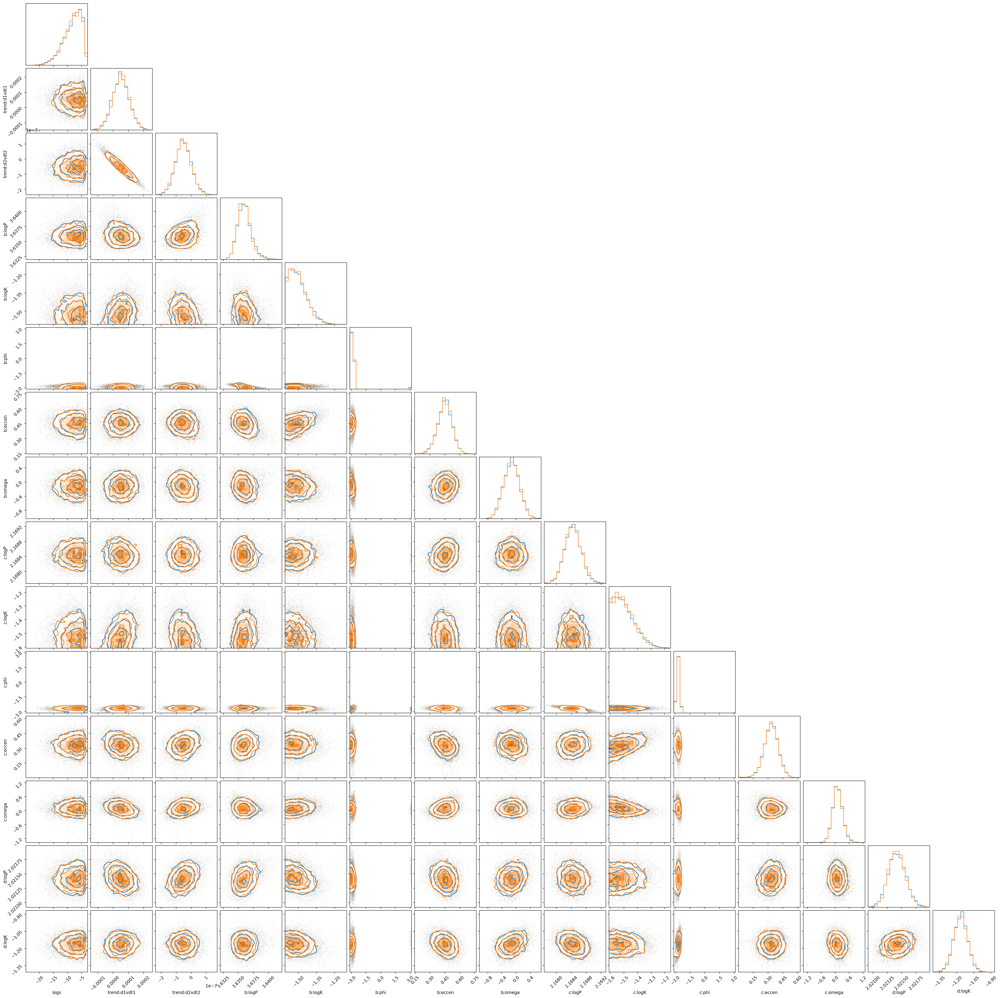

In [122]:
tau = sampler.get_autocorr_time().max()
samples = sampler.get_blobs(flat=True, discard=int(2*tau), thin=int(tau))
df_emcee = pd.DataFrame.from_records(samples[key_vars])

ranges = [(np.min(df_emcee[k]), np.max(df_emcee[k])) for k in df_emcee.columns]

df_pymc = pm.trace_to_dataframe(trace, varnames=key_vars)

w_pymc = len(df_emcee) / len(df_pymc) + np.zeros(len(df_pymc))

v = key_vars[:15]
fig = corner.corner(df_emcee[v], color="C0",
                    range=ranges[:len(v)])
corner.corner(df_pymc[v], weights=w_pymc, color="C1", fig=fig,
              range=ranges[:len(v)]);